In [1]:
%load_ext autoreload

In [4]:
import os, sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
from utils.helpers import launch_env, wrap_env, view_results_ipython
from simulation.gym_duckietown.wrappers import SteeringToWheelVelWrapper
import numpy as np

# Control

In robotics, control is often considered a discipline in its own right. Simply, control theory allows us to map from sensory data (or, some sort of intermediate representation) to actuation commands - these commands can help drive our Duckiebot, fly our planes, and even land our rockets.

For those coming from a machine learning background (or those with familiarity with reinforcement learning and imitation learning), you may have noticed a difference between the control covered in class and the controllers, or *policies*, that you may normally train. In robotics, an important part of control is feedback; Feedback allows our controller to self-regulate and tune, and is an important part of the control process. 

In this exercise, we will cover two controllers: a simple, PD controller, and a slightly more complicated pure-pursuit controller in Part 2. 


## Part 1: PID

A PID controller, named for its components of **Proportional**, **Integral**, and **Derivative**, is a simple yet robust mechanism. This generality has lead to its widespread use across multiple disciplines, and is what our exercise will start with. More eloquently (from Wikipedia): *A PID controller continuously calculates an error value e(t) as the difference between a desired setpoint (SP) and a measured process variable (PV) and applies a correction based on proportional, integral, and derivative terms (denoted P, I, and D respectively), hence the name.*

*In practical terms it automatically applies accurate and responsive correction to a control function.*

In our exercise, we will only implement the **P**ropotional and (an approximation to the) **D**erivative control corrections.

Before we begin with the practical portion, the **first part of the exercise** consists of the following:

*Explain, qualitatively, the difference between the three terms. For the following types of controllers, explain the error terms involved in the correction, and what types of applications they are commonly used for. If these controllers do not exist (or cannot), explain why.*

1. P

2. PI
3. PD
4. ID
5. PID

Put your answers inside of the zip file, inside of a file named **03-control.txt**.

***

As we continue towards the practical portion of the first exercise, we will be tasked with setting up a controller that keeps the Duckiebot on the road. 

In the kinematics exercise, we saw how to translate linear and angular velocity commands into wheel rate. After understanding the conversion, we still need to answer a more important question: *what* commands should we use to control the Duckiebot?

Since we're using a simulation, we are able to access the ground-truth values of two variables that are crucial to help our Duckiebot stay in the lane: $d$, the distance to the center of the lane, and $\omega$, the angle with respect to the lane. 

In your file `notebooks/code/exercise_03_control/controller.py`, complete function `angle_control_commands`. Update `omega` (angular speed) to achieve your goal while keeping `v` constant.

In [41]:
%autoreload
from notebooks.code.exercise_03_control.controller import Controller

# Setting up the environment
local_env = launch_env()
local_env = SteeringToWheelVelWrapper(wrap_env(local_env))
local_env.reset()
local_env.robot_speed = 0.5
total_reward = 0        
controller = Controller()
dist_in_time = []
angle_in_time = []
    
# Starting to drive
for _ in range(1000):
    # Getting the pose
    lane_pose = local_env.get_lane_pos2(local_env.cur_pos, local_env.cur_angle)
    dist = lane_pose.dist        # Distance to lane center. Left is negative, right is positive.
    angle = lane_pose.angle_rad  # Angle from straight, in radians. Left is negative, right is positive.
    
    dist_in_time.append(dist)
    angle_in_time.append(angle)
    
    # Control
    v = 0.5  # For now, keep linear velocity constant                                                
    omega = controller.angle_control_commands(dist, angle)
    commands = np.array([v, omega])
    
    # Step
    _, r, d, _ = local_env.step(commands)
    total_reward += r
    
    if d: 
        print("Duckiebot crashed.")
        break
        
        
local_env.close()

[autoreload of notebooks.code.exercise_03_control.controller failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 450, in superreload
    update_generic(old_obj, new_obj)
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 387, in update_generic
    update(a, b)
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 357, in update_class
    update_instances(old, new)
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 280, in update_instances
    frame = next(frame_nfo.frame for frame_nfo in inspect.stack()
StopIteration
]
19:25:21|gym-duckietown|graphics.py:125|create_frame_buffers(): Falling back to non-multisampled frame buffer
19:25:21|gym-duckietown|graphics.py:

19:25:21|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
19:25:21|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [3.59826268 0.         2.08721855]
19:25:21|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.5894849  0.         2.18432262]
19:25:21|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [3.60704045 0.         1.99011448]
19:25:21|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.48173779 0.         2.07668522]
19:25:21|gym-duckietown|simulator.py:1092|_drivable_pos(): [3.48172154 0.         1.84866924] corresponds to tile at (5, 3) which is not drivable: {'coords': (5, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f908c0e0630>, 'color': array([1, 1, 1])}
19:25:21|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
19:25:21|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
19:25:21|gym-du

19:25:21|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
19:25:21|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
19:25:21|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [3.57500004 0.         2.14999713]
19:25:21|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.49620504 0.         2.20742184]
19:25:21|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [3.65379505 0.         2.09257242]
19:25:21|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.50609039 0.         2.05544313]
19:25:21|gym-duckietown|simulator.py:1092|_drivable_pos(): [4.12972415 0.         2.27350789] corresponds to tile at (7, 3) which is not drivable: {'coords': (7, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f908c0e0630>, 'color': array([1, 1, 1])}
19:25:21|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True

19:25:27|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
19:25:27|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [2.33703727 0.         2.57700384]
19:25:27|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [2.24568806 0.         2.542922  ]
19:25:27|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [2.42838647 0.         2.61108568]
19:25:27|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [2.37793548 0.         2.46738479]
19:25:27|gym-duckietown|simulator.py:1092|_drivable_pos(): [2.28873639 0.         2.68406941] corresponds to tile at (3, 4) which is not drivable: {'coords': (3, 4), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f908c0e0630>, 'color': array([1, 1, 1])}
19:25:27|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
19:25:27|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
19:25:27|gym-du

19:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.27083641 0.         3.13695014] angle 2.942140878555189
19:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.27083641 0.         3.13695014] angle 2.942140878555189
19:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.24798622 0.         3.13242644] angle 2.9501544189844364
19:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.24798622 0.         3.13242644] angle 2.9501544189844364
19:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.22508602 0.         3.1281639 ] angle 2.9649720471166985
19:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.22508602 0.         3.1281639 ] angle 2.9649720471166985
19:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.20211937 0.         3.1242759 ] angle 2.9828155600551707
19:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.20211937 0.         3.1242759 ] angle 2.9828155600551707
19:25:28|gym-duckietown|si

19:25:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.62078509 0.         3.10078725] angle 3.139363794805685
19:25:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.5974914  0.         3.10073963] angle 3.139733056830499
19:25:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.5974914  0.         3.10073963] angle 3.139733056830499
19:25:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.5741977 0.        3.1006999] angle 3.14004120834872
19:25:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.5741977 0.        3.1006999] angle 3.14004120834872
19:25:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.55090399 0.         3.10066676] angle 3.140298341067503
19:25:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.55090399 0.         3.10066676] angle 3.140298341067503
19:25:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.52761027 0.         3.10063911] angle 3.1405128872666843
19:25:29|gym-duckietown|simulator.py:14

19:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98532077 0.         3.04196085] angle 2.243699703976748
19:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97238958 0.         3.02261868] angle 2.0765021286755196
19:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97238958 0.         3.02261868] angle 2.0765021286755196
19:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96269775 0.         3.00146168] angle 1.9242143689543365
19:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96269775 0.         3.00146168] angle 1.9242143689543365
19:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.95618484 0.         2.97911667] angle 1.7846054560177156
19:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.95618484 0.         2.97911667] angle 1.7846054560177156
19:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.95264138 0.         2.95610865] angle 1.6626054599701194
19:25:31|gym-duckietown|s

19:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99325972 0.         2.39951883] angle 1.561205962404538
19:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99325972 0.         2.39951883] angle 1.561205962404538
19:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99346472 0.         2.376226  ] angle 1.5627847928902885
19:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99346472 0.         2.376226  ] angle 1.5627847928902885
19:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99363596 0.         2.3529329 ] angle 1.5641056177932373
19:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99363596 0.         2.3529329 ] angle 1.5641056177932373
19:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99377895 0.         2.32963961] angle 1.565209970607586
19:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99377895 0.         2.32963961] angle 1.565209970607586
19:25:32|gym-duckietown|simu

19:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449224 0.         1.74729727] angle 1.570736090014327
19:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449224 0.         1.74729727] angle 1.570736090014327
19:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449353 0.         1.72400353] angle 1.570746080558713
19:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449353 0.         1.72400353] angle 1.570746080558713
19:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9944946 0.        1.7007098] angle 1.5707544141538647
19:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9944946 0.        1.7007098] angle 1.5707544141538647
19:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9944955  0.         1.67741607] angle 1.5707613655989756
19:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9944955  0.         1.67741607] angle 1.5707613655989756
19:25:34|gym-duckietown|simulator.

19:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99719817 0.         1.09517274] angle 1.4495686462116213
19:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99719817 0.         1.09517274] angle 1.4495686462116213
19:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.00129908 0.         1.07225513] angle 1.3378893179201354
19:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.00129908 0.         1.07225513] angle 1.3378893179201354
19:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.00800731 0.         1.04996253] angle 1.2191065138375787
19:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.00800731 0.         1.04996253] angle 1.2191065138375787
19:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.01755156 0.         1.02873523] angle 1.0774083418896852
19:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.01755156 0.         1.02873523] angle 1.0774083418896852
19:25:35|gym-duckietown|

19:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.56934771 0.         0.99118759] angle -0.0253808768628501
19:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.56934771 0.         0.99118759] angle -0.0253808768628501
19:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.59263509 0.         0.99173091] angle -0.021272404267181168
19:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.59263509 0.         0.99173091] angle -0.021272404267181168
19:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.61592437 0.         0.99218609] angle -0.017812381745678448
19:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.61592437 0.         0.99218609] angle -0.017812381745678448
19:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.63921498 0.         0.99256712] angle -0.014903997708951287
19:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.63921498 0.         0.99256712] angle -0.014903997708951287
19:2

19:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.19825735 0.         0.99447497] angle -0.0001943605237068432
19:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.22155109 0.         0.99447912] angle -0.00016212667769661265
19:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.22155109 0.         0.99447912] angle -0.00016212667769661265
19:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.24484482 0.         0.99448258] angle -0.00013523830147544935
19:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.24484482 0.         0.99448258] angle -0.00013523830147544935
19:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.26813856 0.         0.99448547] angle -0.00011280905584164673
19:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.26813856 0.         0.99448547] angle -0.00011280905584164673
19:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.29143229 0.         0.99448788] angle -9.409952

19:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.8504819  0.         0.99449984] angle -1.2115411968519471e-06
19:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.8504819  0.         0.99449984] angle -1.2115411968519471e-06
19:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.87377564 0.         0.99449987] angle -1.0105689120684521e-06
19:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.87377564 0.         0.99449987] angle -1.0105689120684521e-06
19:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.89706937 0.         0.99449989] angle -8.429913912906194e-07
19:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.89706937 0.         0.99449989] angle -8.429913912906194e-07
19:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.92036311 0.         0.99449991] angle -7.032250246912278e-07
19:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.92036311 0.         0.99449991] angle -7.03225024

19:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.47941272 0.         0.9945    ] angle -1.1783122663535584e-08
19:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.50270646 0.         0.9945    ] angle -9.110424398942155e-09
19:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.50270646 0.         0.9945    ] angle -9.110424398942155e-09
19:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.52600019 0.         0.9945    ] angle -1.3379799847612957e-08
19:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.52600019 0.         0.9945    ] angle -1.3379799847612957e-08
19:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.54929191 0.         0.99476535] angle -0.02278444347776906
19:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.54929191 0.         0.99476535] angle -0.02278444347776906
19:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.57254842 0.         0.99601447] angle -0.0845334524027

19:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69286519 0.         1.46378024] angle -1.6259744537987224
19:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69167998 0.         1.48704373] angle -1.6174246429580164
19:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69167998 0.         1.48704373] angle -1.6174246429580164
19:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69067949 0.         1.51031592] angle -1.610097174704024
19:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69067949 0.         1.51031592] angle -1.610097174704024
19:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68983693 0.         1.53359437] angle -1.603852860940951
19:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68983693 0.         1.53359437] angle -1.603852860940951
19:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68912874 0.         1.55687731] angle -1.5985549975561624
19:25:41|gym-duckiet

19:25:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68554732 0.         2.11590154] angle -1.571163672645103
19:25:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68553947 0.         2.13919527] angle -1.571102754926332
19:25:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68553947 0.         2.13919527] angle -1.571102754926332
19:25:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68553292 0.         2.16248901] angle -1.5710519378084509
19:25:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68553292 0.         2.16248901] angle -1.5710519378084509
19:25:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68552746 0.         2.18578274] angle -1.5710095470322523
19:25:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68552746 0.         2.18578274] angle -1.5710095470322523
19:25:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68552291 0.         2.20907647] angle -1.570974185699474
19:25:42|gym-duckiet

19:25:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.40852702 0.         2.54371245] angle -3.3085859561400315
19:25:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.3855345  0.         2.53997944] angle -3.296505326174133
19:25:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.3855345  0.         2.53997944] angle -3.296505326174133
19:25:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.36249337 0.         2.53655981] angle -3.281357189466884
19:25:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.36249337 0.         2.53655981] angle -3.281357189466884
19:25:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.33940171 0.         2.53350008] angle -3.265300592262232
19:25:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.33940171 0.         2.53350008] angle -3.265300592262232
19:25:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.31626437 0.         2.53080742] angle -3.249597108182257
19:25:43|gym-duckietown

19:25:44|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.7604471  0.         2.54060154] angle -2.817250623539153
19:25:44|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.73857614 0.         2.5486097 ] angle -2.76394713486911
19:25:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.73857614 0.         2.5486097 ] angle -2.76394713486911
19:25:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.71714115 0.         2.5577219 ] angle -2.7153132926713575
19:25:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.71714115 0.         2.5577219 ] angle -2.7153132926713575
19:25:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.69616267 0.         2.5678414 ] angle -2.66897500970047
19:25:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.69616267 0.         2.5678414 ] angle -2.66897500970047
19:25:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.6756598  0.         2.57889331] angle -2.6254268216511103
19:25:45|gym-duckietown|s

19:25:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.48583359 0.         3.05675611] angle -1.9435360648251379
19:25:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.47542662 0.         3.07755979] angle -2.1257464129399777
19:25:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.47542662 0.         3.07755979] angle -2.1257464129399777
19:25:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.46137487 0.         3.09609515] angle -2.313182441062939
19:25:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.46137487 0.         3.09609515] angle -2.313182441062939
19:25:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.44411988 0.         3.11169282] angle -2.5000154259130523
19:25:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.44411988 0.         3.11169282] angle -2.5000154259130523
19:25:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.42434832 0.         3.12395379] angle -2.672988117196386
19:25:46|gym-duckie

19:25:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.87026366 0.         3.10239645] angle -3.1562130305905356
19:25:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.84697203 0.         3.10208378] angle -3.1538193165483834
19:25:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.84697203 0.         3.10208378] angle -3.1538193165483834
19:25:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.82367977 0.         3.10182235] angle -3.1518124377494257
19:25:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.82367977 0.         3.10182235] angle -3.1518124377494257
19:25:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.80038706 0.         3.10160388] angle -3.1501315559407237
19:25:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.80038706 0.         3.10160388] angle -3.1501315559407237
19:25:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.77709404 0.         3.10142136] angle -3.148724840598494
19:25:47|gym-duck

19:25:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.21804608 0.         3.10051189] angle -3.141684994212513
19:25:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.19475234 0.         3.10050992] angle -3.14166967930119
19:25:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.19475234 0.         3.10050992] angle -3.14166967930119
19:25:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.17145861 0.         3.10050828] angle -3.141656904327552
19:25:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.17145861 0.         3.10050828] angle -3.141656904327552
19:25:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.14816487 0.         3.1005069 ] angle -3.1416462480738603
19:25:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.14816487 0.         3.1005069 ] angle -3.1416462480738603
19:25:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.12487558 0.         3.10011295] angle -3.175367257603318
19:25:48|gym-duckietown|

19:25:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98613014 0.         2.64906658] angle -4.774713044030402
19:25:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98747006 0.         2.62581151] angle -4.765174377867534
19:25:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98747006 0.         2.62581151] angle -4.765174377867534
19:25:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98860348 0.         2.60254543] angle -4.756958362008558
19:25:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98860348 0.         2.60254543] angle -4.756958362008558
19:25:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98955954 0.         2.57927137] angle -4.749929804636546
19:25:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98955954 0.         2.57927137] angle -4.749929804636546
19:25:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99036418 0.         2.55599158] angle -4.743948662649123
19:25:50|gym-duckietown|

19:25:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99444596 0.         1.99697488] angle -4.712808528275299
19:25:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99445492 0.         1.97368115] angle -4.712738955539325
19:25:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99445492 0.         1.97368115] angle -4.712738955539325
19:25:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9944624  0.         1.95038742] angle -4.712680917895112
19:25:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9944624  0.         1.95038742] angle -4.712680917895112
19:25:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99446863 0.         1.92709369] angle -4.712632503492318
19:25:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99446863 0.         1.92709369] angle -4.712632503492318
19:25:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99447384 0.         1.90379995] angle -4.712592117139969
19:25:51|gym-duckietown|

19:25:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449966 0.         1.34475034] angle -4.712391596107902
19:25:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449972 0.         1.3214566 ] angle -4.712391162263213
19:25:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449972 0.         1.3214566 ] angle -4.712391162263213
19:25:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449977 0.         1.29816287] angle -4.712390800390953
19:25:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449977 0.         1.29816287] angle -4.712390800390953
19:25:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9944998  0.         1.27486914] angle -4.71239049855076
19:25:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9944998  0.         1.27486914] angle -4.71239049855076
19:25:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449984 0.         1.2515754 ] angle -4.712390246780594
19:25:52|gym-duckietown|si

19:25:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.3200068  0.         0.97373699] angle -6.421581859642284
19:25:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.3431027 0.        0.9767645] angle -6.405471213325069
19:25:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.3431027 0.        0.9767645] angle -6.405471213325069
19:25:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.36624379 0.         0.97942479] angle -6.389813903866349
19:25:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.36624379 0.         0.97942479] angle -6.389813903866349
19:25:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.38942245 0.         0.98173517] angle -6.375254124707014
19:25:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.38942245 0.         0.98173517] angle -6.375254124707014
19:25:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.41263095 0.         0.9837241 ] angle -6.36209564750986
19:25:53|gym-duckietown|simulat

19:25:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.97146257 0.         0.99435435] angle -6.284315759084755
19:25:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.99475629 0.         0.9943785 ] angle -6.284128374143169
19:25:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.99475629 0.         0.9943785 ] angle -6.284128374143169
19:25:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.01805001 0.         0.99439865] angle -6.283972032747353
19:25:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.01805001 0.         0.99439865] angle -6.283972032747353
19:25:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.04134374 0.         0.99441546] angle -6.2838415977529465
19:25:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.04134374 0.         0.99441546] angle -6.2838415977529465
19:25:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.06463747 0.         0.99442948] angle -6.2837327802365195
19:25:55|gym-duckieto

19:25:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.62368708 0.         0.99449909] angle -6.28319235797496
19:25:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.64698081 0.         0.99449924] angle -6.2831911885503375
19:25:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.64698081 0.         0.99449924] angle -6.2831911885503375
19:25:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.67027454 0.         0.99449937] angle -6.283190213082953
19:25:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.67027454 0.         0.99449937] angle -6.283190213082953
19:25:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.69356828 0.         0.99449947] angle -6.283189399406841
19:25:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.69356828 0.         0.99449947] angle -6.283189399406841
19:25:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.71686201 0.         0.99449956] angle -6.28318872068054
19:25:56|gym-duckietown|

19:25:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.27591163 0.         0.99449999] angle -6.283185352412649
19:25:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.27591163 0.         0.99449999] angle -6.283185352412649
19:25:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.29920536 0.         0.9945    ] angle -6.283185344533395
19:25:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.29920536 0.         0.9945    ] angle -6.283185344533395
19:25:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.32249909 0.         0.9945    ] angle -6.283185338306426
19:25:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.32249909 0.         0.9945    ] angle -6.283185338306426
19:25:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.34579283 0.         0.9945    ] angle -6.28318533303045
19:25:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.34579283 0.         0.9945    ] angle -6.28318533303045
19:25:57|gym-duckietown|si

19:25:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.7153456  0.         1.26142978] angle -8.024610490420717
19:25:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.7153456  0.         1.26142978] angle -8.024610490420717
19:25:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.71150477 0.         1.28440459] angle -8.014640369300144
19:25:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.71150477 0.         1.28440459] angle -8.014640369300144
19:25:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70794272 0.         1.30742416] angle -8.00036835693158
19:25:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70794272 0.         1.30742416] angle -8.00036835693158
19:25:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70472857 0.         1.33049483] angle -7.984447954786067
19:25:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70472857 0.         1.33049483] angle -7.984447954786067
19:25:58|gym-duckietown|si

19:25:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68572951 0.         1.9121728 ] angle -7.855762625550135
19:25:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68572951 0.         1.9121728 ] angle -7.855762625550135
19:25:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68569146 0.         1.9354665 ] angle -7.855467529321918
19:25:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68569146 0.         1.9354665 ] angle -7.855467529321918
19:25:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68565972 0.         1.95876021] angle -7.85522128067167
19:25:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68565972 0.         1.95876021] angle -7.85522128067167
19:25:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68563324 0.         1.98205393] angle -7.85501580936658
19:25:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68563324 0.         1.98205393] angle -7.85501580936658
19:25:59|gym-duckietown|simu

19:26:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60789848 0.         2.53741972] angle -8.915065499128234
19:26:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60789848 0.         2.53741972] angle -8.915065499128234
19:26:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.58677269 0.         2.54717821] angle -9.069041191329498
19:26:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.58677269 0.         2.54717821] angle -9.069041191329498
19:26:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.56443987 0.         2.55373183] angle -9.209636045088569
19:26:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.56443987 0.         2.55373183] angle -9.209636045088569
19:26:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.54143949 0.         2.55732743] angle -9.329774821777626
19:26:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.54143949 0.         2.55732743] angle -9.329774821777626
19:26:01|gym-duckietown|

19:26:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.96156268 0.         2.51653832] angle -9.432812992940402
19:26:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.96156268 0.         2.51653832] angle -9.432812992940402
19:26:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.93826958 0.         2.51636659] angle -9.431488315625856
19:26:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.93826958 0.         2.51636659] angle -9.431488315625856
19:26:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.91497629 0.         2.51622318] angle -9.430380734677112
19:26:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.91497629 0.         2.51622318] angle -9.430380734677112
19:26:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.8916835  0.         2.51636282] angle -9.40718502954588
19:26:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.8916835  0.         2.51636282] angle -9.40718502954588
19:26:02|gym-duckietown|si

19:26:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.47981227 0.         2.85638553] angle -7.893424444182645
19:26:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.47981227 0.         2.85638553] angle -7.893424444182645
19:26:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.47983906 0.         2.87967285] angle -7.812238761943072
19:26:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.47983906 0.         2.87967285] angle -7.812238761943072
19:26:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.48166856 0.         2.90288933] angle -7.738445239014668
19:26:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.48166856 0.         2.90288933] angle -7.738445239014668
19:26:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.48519985 0.         2.92590855] angle -7.66507958095713
19:26:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.48519985 0.         2.92590855] angle -7.66507958095713
19:26:03|gym-duckietown|si

19:26:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.07016951 0.         3.10909245] angle -9.488423881691393
19:26:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.07016951 0.         3.10909245] angle -9.488423881691393
19:26:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.04691616 0.         3.10772292] angle -9.478787880622075
19:26:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.04691616 0.         3.10772292] angle -9.478787880622075
19:26:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.02365142 0.         3.10656241] angle -9.470450910141103
19:26:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.02365142 0.         3.10656241] angle -9.470450910141103
19:26:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.00037837 0.         3.10558216] angle -9.463294664006385
19:26:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.00037837 0.         3.10558216] angle -9.463294664006385
19:26:04|gym-duckietown|

19:26:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.41808453 0.         3.10055571] angle -9.425210469765975
19:26:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.41808453 0.         3.10055571] angle -9.425210469765975
19:26:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.3947908  0.         3.10054647] angle -9.425138749211879
19:26:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.3947908  0.         3.10054647] angle -9.425138749211879
19:26:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.37149706 0.         3.10053877] angle -9.425078919366598
19:26:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.37149706 0.         3.10053877] angle -9.425078919366598
19:26:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.34820333 0.         3.10053234] angle -9.425029009599251
19:26:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.34820333 0.         3.10053234] angle -9.425029009599251
19:26:06|gym-duckietown|

19:26:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96224781 0.         2.84708892] angle -11.168180803244436
19:26:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96224781 0.         2.84708892] angle -11.168180803244436
19:26:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96618786 0.         2.82413086] angle -11.162895190019197
19:26:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96618786 0.         2.82413086] angle -11.162895190019197
19:26:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96992932 0.         2.80113971] angle -11.150894160454143
19:26:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96992932 0.         2.80113971] angle -11.150894160454143
19:26:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97335859 0.         2.77810001] angle -11.135768862950052
19:26:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97335859 0.         2.77810001] angle -11.135768862950052
19:26:07|gym-duc

19:26:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99424366 0.         2.19655155] angle -10.997563302838948
19:26:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99424366 0.         2.19655155] angle -10.997563302838948
19:26:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99428615 0.         2.17325786] angle -10.997233785394542
19:26:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99428615 0.         2.17325786] angle -10.997233785394542
19:26:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99432161 0.         2.14996415] angle -10.99695879803587
19:26:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99432161 0.         2.14996415] angle -10.99695879803587
19:26:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99435118 0.         2.12667044] angle -10.996729336709608
19:26:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99435118 0.         2.12667044] angle -10.996729336709608
19:26:08|gym-ducki

19:26:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9944984  0.         1.54432713] angle -10.995586700428065
19:26:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9944984  0.         1.54432713] angle -10.995586700428065
19:26:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449867 0.         1.5210334 ] angle -10.995584641664168
19:26:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449867 0.         1.5210334 ] angle -10.995584641664168
19:26:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449889 0.         1.49773966] angle -10.995582924362989
19:26:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449889 0.         1.49773966] angle -10.995582924362989
19:26:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449907 0.         1.47444593] angle -10.995581491887895
19:26:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449907 0.         1.47444593] angle -10.995581491887895
19:26:10|gym-duc

19:26:11|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.12216819 0.         0.95479614] angle -12.386692659314793
19:26:11|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.12216819 0.         0.95479614] angle -12.386692659314793
19:26:11|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.14527736 0.         0.95197642] angle -12.503214313879862
19:26:11|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.14527736 0.         0.95197642] angle -12.503214313879862
19:26:11|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.16855943 0.         0.95165082] angle -12.601558283198615
19:26:11|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.16855943 0.         0.95165082] angle -12.601558283198615
19:26:11|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.19177855 0.         0.95342924] angle -12.684070106578014
19:26:11|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.19177855 0.         0.95342924] angle -12.684070106578014
19:26:11|gym-duc

19:26:12|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.77173582 0.         0.99381507] angle -12.571677844346906
19:26:12|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.77173582 0.         0.99381507] angle -12.571677844346906


You can see how well you are doing:

In [42]:
print("Your score: {}".format(total_reward))
view_results_ipython(local_env)

Your score: 587.6136123111545


In [7]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10, 5]

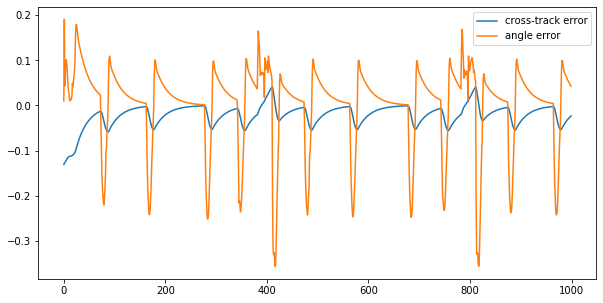

In [8]:
import matplotlib.pyplot as plt

plt.plot(np.arange(1000), dist_in_time)
plt.plot(np.arange(1000), angle_in_time)
plt.legend(["cross-track error", "angle error"])
plt.show()

Within **03-control.txt**, answer the following question:

*Describe the method you used. What kind of controller is it?*

Then, from the list of popular variants of PID controllers, implement a second one. Answer the above question again, and then discuss the differences (both in terms of algorithm and performance) between the two. Do you see any qualitative differences in the driving? Why or why not? Put your answers in **03-control.txt**.

Lastly, for both implementation, plot the **cross-track** error and the **angle error**, and submit the plot(s) (depending on if you decide to separate the metrics on two plots) in the zip file. 

## Part 2: Pure Pursuit

Within **03-control.txt**, answer the following question:

*While robust, general, and simple, PID controllers also have limitations. What are some failure cases of PID controllers?*

Just tracking an instataneous value

In this section, we'll be looking into a type of controller known as a *Pure Pursuit* (PP) controller. A PP controller is not explicitly a reactive controller, but actually requires a reference trajectory that the controller follows. When we input the pose, velocity, and current waypoint, the controller outputs control commands that are used to steer the robot.

Besides robot-specific parameters (which need to be set only once), a PP controller has a single, tunable parameter: *look-ahead* distance. The look-ahead distance is how far along the current path (more on how we do this next section) the robot should _look ahead_ from to compute the angular velocity commands. For simplicity, in our example, the velocity will be fixed.

Before we move on to the code, write the answer to the following in **03-control.txt**:

*Recall the lecture notes about PP controllers. How does the look-ahead distance affect performance? What does a small look-ahead distance prioritize? What about a larger one?*

*** 

As we start the last practical portion of the exercise, we recall a requirement of the PP controller: a reference trajectory. How can we get this from the simulator?

The answer lies inside of the `simulator.py` code, available [here](https://github.com/duckietown/gym-duckietown/blob/master/gym_duckietown/simulator.py). In `gym-duckietown`, we load every tile with a *Bezier* curve, which allows us to calculate a *reward* (useful in reinforcement learning, which we will see later). Each Bezier curve was designed to perfectly fit the right lane of each tile.

`gym-duckietown` provides a few helper functions that we will make use of. Inside of `controller.py:Controller:pure_pursuit`, you will notice a call to `closest_curve_point`, which returns the closest point on the reference trajectory. 

While we have a boilerplate function written, it still needs work. In particular, the main things that need your attention are:

- `follow_point` needs to be a function of a few more items, not just the closest point.
- Once you have the correct waypoint, you need to calculate the $\omega$ that gets you there. You can also change $v$ to go as fast as possible.


In [40]:
%autoreload
from notebooks.code.exercise_03_control.controller import Controller

# Reset environment
local_env = launch_env()
local_env = SteeringToWheelVelWrapper(wrap_env(local_env))
local_env.reset()
local_env.robot_speed = 0.5
controller = Controller()
total_reward = 0
dist_in_time = []
angle_in_time = []
v_in_time = []
omega_in_time = []
    
# Starting to drive
for _ in range(1000):
    
    # Getting the global pose
    pos = local_env.cur_pos
    angle = local_env.cur_angle
    lane_pose = local_env.get_lane_pos2(pos, angle)
    
    dist_in_time.append(lane_pose.dist)
    angle_in_time.append(lane_pose.angle_rad)

    
    # Control
    v, omega = controller.pure_pursuit(local_env, pos, angle)
    commands = np.array([v, omega])
    
    v_in_time.append(v)
    omega_in_time.append(omega)
    
    # Step
    _, r, d, _ = local_env.step(commands)
    total_reward += r
    
    if d: 
        print("Duckiebot crashed.")
        break
        
local_env.close()

[autoreload of notebooks.code.exercise_03_control.controller failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 450, in superreload
    update_generic(old_obj, new_obj)
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 387, in update_generic
    update(a, b)
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 357, in update_class
    update_instances(old, new)
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 280, in update_instances
    frame = next(frame_nfo.frame for frame_nfo in inspect.stack()
StopIteration
]
19:19:15|gym-duckietown|graphics.py:125|create_frame_buffers(): Falling back to non-multisampled frame buffer
19:19:15|gym-duckietown|graphics.py:

19:19:15|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
19:19:15|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [3.59826268 0.         2.08721855]
19:19:15|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.5894849  0.         2.18432262]
19:19:15|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [3.60704045 0.         1.99011448]
19:19:15|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.48173779 0.         2.07668522]
19:19:15|gym-duckietown|simulator.py:1092|_drivable_pos(): [3.48172154 0.         1.84866924] corresponds to tile at (5, 3) which is not drivable: {'coords': (5, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f908c0e0630>, 'color': array([1, 1, 1])}
19:19:15|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
19:19:15|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
19:19:15|gym-du

19:19:15|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
19:19:15|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
19:19:15|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [3.57500004 0.         2.14999713]
19:19:15|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.49620504 0.         2.20742184]
19:19:15|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [3.65379505 0.         2.09257242]
19:19:15|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.50609039 0.         2.05544313]
19:19:15|gym-duckietown|simulator.py:1092|_drivable_pos(): [4.12972415 0.         2.27350789] corresponds to tile at (7, 3) which is not drivable: {'coords': (7, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f908c0e0630>, 'color': array([1, 1, 1])}
19:19:15|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True

19:19:20|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
19:19:20|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [2.33703727 0.         2.57700384]
19:19:20|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [2.24568806 0.         2.542922  ]
19:19:20|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [2.42838647 0.         2.61108568]
19:19:20|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [2.37793548 0.         2.46738479]
19:19:20|gym-duckietown|simulator.py:1092|_drivable_pos(): [2.28873639 0.         2.68406941] corresponds to tile at (3, 4) which is not drivable: {'coords': (3, 4), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f908c0e0630>, 'color': array([1, 1, 1])}
19:19:20|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
19:19:20|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
19:19:20|gym-du

19:19:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.25807788 0.         3.12006422] angle 3.129011865334054
19:19:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.25807788 0.         3.12006422] angle 3.129011865334054
19:19:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.23478834 0.         3.11962997] angle 3.116886843833687
19:19:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.23478834 0.         3.11962997] angle 3.116886843833687
19:19:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.21150483 0.         3.11894285] angle 3.107292930878603
19:19:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.21150483 0.         3.11894285] angle 3.107292930878603
19:19:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.18822794 0.         3.11805845] angle 3.0999396513979884
19:19:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.18822794 0.         3.11805845] angle 3.0999396513979884
19:19:22|gym-duckietown|simula

19:19:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.60625772 0.         3.09976794] angle 3.138423338864647
19:19:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.60625772 0.         3.09976794] angle 3.138423338864647
19:19:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.58296407 0.         3.09970741] angle 3.1395650094141967
19:19:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.58296407 0.         3.09970741] angle 3.1395650094141967
19:19:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.55967036 0.         3.09967143] angle 3.1405306642734905
19:19:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.55967036 0.         3.09967143] angle 3.1405306642734905
19:19:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.53637663 0.         3.09965566] angle 3.1413007156220565
19:19:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.53637663 0.         3.09965566] angle 3.1413007156220565
19:19:23|gym-duckietown|si

19:19:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.00028668 0.         2.97199037] angle 2.02812028382718
19:19:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.00028668 0.         2.97199037] angle 2.02812028382718
19:19:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99084173 0.         2.95070409] angle 1.94869522695009
19:19:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99084173 0.         2.95070409] angle 1.94869522695009
19:19:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9830243  0.         2.92876652] angle 1.877537334227938
19:19:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9830243  0.         2.92876652] angle 1.877537334227938
19:19:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97670466 0.         2.90635055] angle 1.813642412419169
19:19:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97670466 0.         2.90635055] angle 1.813642412419169
19:19:25|gym-duckietown|simulator.py

19:19:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99137583 0.         2.32606263] angle 1.532229435549728
19:19:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99137583 0.         2.32606263] angle 1.532229435549728
19:19:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99221733 0.         2.30278413] angle 1.5370966771633738
19:19:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99221733 0.         2.30278413] angle 1.5370966771633738
19:19:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99294907 0.         2.27950191] angle 1.5416581026915452
19:19:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99294907 0.         2.27950191] angle 1.5416581026915452
19:19:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99357777 0.         2.25621668] angle 1.5459476756323947
19:19:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99357777 0.         2.25621668] angle 1.5459476756323947
19:19:26|gym-duckietown|si

19:19:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99483842 0.         1.67389239] angle 1.573425834534269
19:19:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99483842 0.         1.67389239] angle 1.573425834534269
19:19:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99477994 0.         1.65059873] angle 1.573188024712988
19:19:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99477994 0.         1.65059873] angle 1.573188024712988
19:19:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99472699 0.         1.62730506] angle 1.5729508154192144
19:19:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99472699 0.         1.62730506] angle 1.5729508154192144
19:19:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99467952 0.         1.60401137] angle 1.5727179706768266
19:19:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99467952 0.         1.60401137] angle 1.5727179706768266
19:19:28|gym-duckietown|simu

19:19:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06709772 0.         1.03827244] angle 0.7592592690483733
19:19:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06709772 0.         1.03827244] angle 0.7592592690483733
19:19:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.08490403 0.         1.02327586] angle 0.6406447256558088
19:19:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.08490403 0.         1.02327586] angle 0.6406447256558088
19:19:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.10426774 0.         1.01034692] angle 0.5367754186391674
19:19:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.10426774 0.         1.01034692] angle 0.5367754186391674
19:19:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.12478616 0.         0.99933611] angle 0.4482663271530254
19:19:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.12478616 0.         0.99933611] angle 0.4482663271530254
19:19:29|gym-duckietown|

19:19:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.7011515  0.         0.98820898] angle -0.05399664963863616
19:19:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.7011515  0.         0.98820898] angle -0.05399664963863616
19:19:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.72441454 0.         0.9894037 ] angle -0.04862757547787647
19:19:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.72441454 0.         0.9894037 ] angle -0.04862757547787647
19:19:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.74768361 0.         0.99047477] angle -0.0433671771992158
19:19:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.74768361 0.         0.99047477] angle -0.0433671771992158
19:19:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.77095791 0.         0.99142551] angle -0.03828560254511631
19:19:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.77095791 0.         0.99142551] angle -0.03828560254511631
19:19:31|g

19:19:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.32995481 0.         0.9951168 ] angle 0.003408805977510241
19:19:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.35324842 0.         0.99503944] angle 0.003233342559575997
19:19:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.35324842 0.         0.99503944] angle 0.003233342559575997
19:19:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.37654204 0.         0.99496645] angle 0.003033137540181053
19:19:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.37654204 0.         0.99496645] angle 0.003033137540181053
19:19:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.39983567 0.         0.99489833] angle 0.002815852223482903
19:19:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.39983567 0.         0.99489833] angle 0.002815852223482903
19:19:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.42312932 0.         0.99483539] angle 0.002588210516735947
19:19:32

19:19:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.98217862 0.         0.99445855] angle -0.0001599694790852266
19:19:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.98217862 0.         0.99445855] angle -0.0001599694790852266
19:19:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.00547236 0.         0.99446228] angle -0.00016080259981006743
19:19:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.00547236 0.         0.99446228] angle -0.00016080259981006743
19:19:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.02876609 0.         0.99446601] angle -0.00015876357302858828
19:19:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.02876609 0.         0.99446601] angle -0.00015876357302858828
19:19:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.05205982 0.         0.99446966] angle -0.000154609386193213
19:19:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.05205982 0.         0.99446966] angle -0.000154609

19:19:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60482253 0.         1.03794624] angle -0.5278979856906549
19:19:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62405679 0.         1.0510516 ] angle -0.6683076411829634
19:19:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62405679 0.         1.0510516 ] angle -0.6683076411829634
19:19:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.64127002 0.         1.06671734] angle -0.8084253101498122
19:19:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.64127002 0.         1.06671734] angle -0.8084253101498122
19:19:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.65631484 0.         1.08448267] angle -0.9278262318262798
19:19:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.65631484 0.         1.08448267] angle -0.9278262318262798
19:19:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.66928964 0.         1.1038157 ] angle -1.0316063537001983
19:19:36|gym-duc

19:19:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69447217 0.         1.65416102] angle -1.6348537604940645
19:19:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69304198 0.         1.67741078] angle -1.6296125845855787
19:19:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69304198 0.         1.67741078] angle -1.6296125845855787
19:19:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69173478 0.         1.70066778] angle -1.6242756007441157
19:19:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69173478 0.         1.70066778] angle -1.6242756007441157
19:19:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69055144 0.         1.72393141] angle -1.6189622935678574
19:19:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69055144 0.         1.72393141] angle -1.6189622935678574
19:19:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68949063 0.         1.74720095] angle -1.6137427307111818
19:19:38|gym-duc

19:19:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.67814559 0.         2.30596911] angle -1.687129558507943
19:19:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.67498724 0.         2.32904621] angle -1.7264948426242905
19:19:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.67498724 0.         2.32904621] angle -1.7264948426242905
19:19:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.67085777 0.         2.35196899] angle -1.7715685837827728
19:19:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.67085777 0.         2.35196899] angle -1.7715685837827728
19:19:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.66557376 0.         2.37465234] angle -1.8277536928170957
19:19:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.66557376 0.         2.37465234] angle -1.8277536928170957
19:19:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.65881367 0.         2.39693786] angle -1.902875432209664
19:19:39|gym-ducki

19:19:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.15987532 0.         2.53474127] angle -3.225945729220826
19:19:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.1366626  0.         2.53280029] angle -3.2240858204680665
19:19:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.1366626  0.         2.53280029] angle -3.2240858204680665
19:19:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.11344343 0.         2.53093822] angle -3.2191472670678296
19:19:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.11344343 0.         2.53093822] angle -3.2191472670678296
19:19:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.09021363 0.         2.52921429] angle -3.212190956737283
19:19:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.09021363 0.         2.52921429] angle -3.212190956737283
19:19:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.0669687  0.         2.52770935] angle -3.2002994100142312
19:19:40|gym-duckie

19:19:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.56426869 0.         2.70815666] angle -2.166129321279307
19:19:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.5519392 0.        2.7279134] angle -2.0913163290839973
19:19:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.5519392 0.        2.7279134] angle -2.0913163290839973
19:19:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.54109261 0.         2.748522  ] angle -2.0192288509212215
19:19:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.54109261 0.         2.748522  ] angle -2.0192288509212215
19:19:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.53157043 0.         2.76977739] angle -1.964724962253205
19:19:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.53157043 0.         2.76977739] angle -1.964724962253205
19:19:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.52307866 0.         2.79146633] angle -1.9232263086440342
19:19:42|gym-duckietown|s

19:19:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.17499633 0.         3.13597284] angle -3.1550782000050606
19:19:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.15171052 0.         3.13538605] angle -3.1784950687291245
19:19:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.15171052 0.         3.13538605] angle -3.1784950687291245
19:19:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.1284422 0.        3.1343059] angle -3.197466270618915
19:19:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.1284422 0.        3.1343059] angle -3.197466270618915
19:19:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.10519515 0.         3.13283504] angle -3.212092875331797
19:19:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.10519515 0.         3.13283504] angle -3.212092875331797
19:19:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.08196841 0.         3.13107116] angle -3.2226845513775104
19:19:43|gym-duckietown|si

19:19:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.52408901 0.         3.09925052] angle -3.1482052531433995
19:19:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.50079564 0.         3.09912195] angle -3.146018984882903
19:19:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.50079564 0.         3.09912195] angle -3.146018984882903
19:19:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.47750205 0.         3.0990402 ] angle -3.1441848335380302
19:19:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.47750205 0.         3.0990402 ] angle -3.1441848335380302
19:19:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.45420836 0.         3.09899793] angle -3.1426302013287333
19:19:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.45420836 0.         3.09899793] angle -3.1426302013287333
19:19:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.43091463 0.         3.09898902] angle -3.1413203755650043
19:19:45|gym-ducki

19:19:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9738739  0.         2.89400178] angle -4.501839830064441
19:19:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96961865 0.         2.87110285] angle -4.555474274464217
19:19:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96961865 0.         2.87110285] angle -4.555474274464217
19:19:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96651962 0.         2.84801835] angle -4.6024052698035876
19:19:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96651962 0.         2.84801835] angle -4.6024052698035876
19:19:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96443386 0.         2.82481979] angle -4.643036887773062
19:19:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96443386 0.         2.82481979] angle -4.643036887773062
19:19:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96322403 0.         2.80155867] angle -4.677812815245177
19:19:46|gym-duckietow

19:19:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99377998 0.         2.24354926] angle -4.735708192881753
19:19:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99427856 0.         2.22026088] angle -4.7318812397908285
19:19:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99427856 0.         2.22026088] angle -4.7318812397908285
19:19:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99469231 0.         2.19697083] angle -4.7284230226286414
19:19:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99469231 0.         2.19697083] angle -4.7284230226286414
19:19:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9950273  0.         2.17367951] angle -4.725118379420577
19:19:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9950273  0.         2.17367951] angle -4.725118379420577
19:19:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9952918  0.         2.15038729] angle -4.72236988621888
19:19:47|gym-duckieto

19:19:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99466707 0.         1.59134129] angle -4.710557300869792
19:19:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99462694 0.         1.56804759] angle -4.710774434928627
19:19:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99462694 0.         1.56804759] angle -4.710774434928627
19:19:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99459173 0.         1.54475388] angle -4.7109806636025064
19:19:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99459173 0.         1.54475388] angle -4.7109806636025064
19:19:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99456118 0.         1.52146016] angle -4.7111745174551105
19:19:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99456118 0.         1.52146016] angle -4.7111745174551105
19:19:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99453501 0.         1.49816645] angle -4.711356412393623
19:19:49|gym-duckiet

19:19:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.13685447 0.         0.99432818] angle -5.877268023481636
19:19:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.15857753 0.         0.98593435] angle -5.9516442613290765
19:19:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.15857753 0.         0.98593435] angle -5.9516442613290765
19:19:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.18084003 0.         0.97909501] angle -6.018603040703903
19:19:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.18084003 0.         0.97909501] angle -6.018603040703903
19:19:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.20349164 0.         0.97367824] angle -6.078315742856163
19:19:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.20349164 0.         0.97367824] angle -6.078315742856163
19:19:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.2264126  0.         0.96954282] angle -6.131053732170562
19:19:50|gym-duckietow

19:19:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.78415619 0.         0.99179043] angle -6.319230867116611
19:19:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.80743668 0.         0.99257511] angle -6.314525693465278
19:19:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.80743668 0.         0.99257511] angle -6.314525693465278
19:19:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.83072051 0.         0.99325362] angle -6.3101095521755965
19:19:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.83072051 0.         0.99325362] angle -6.3101095521755965
19:19:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.85400702 0.         0.99383295] angle -6.306007454730393
19:19:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.85400702 0.         0.99383295] angle -6.306007454730393
19:19:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.87729563 0.         0.99432096] angle -6.302266804647308
19:19:51|gym-duckietow

19:19:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43633473 0.         0.99481192] angle -6.280701287505969
19:19:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.45962839 0.         0.99475674] angle -6.280931659191825
19:19:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.45962839 0.         0.99475674] angle -6.280931659191825
19:19:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.48292208 0.         0.99470691] angle -6.2811601300594155
19:19:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.48292208 0.         0.99470691] angle -6.2811601300594155
19:19:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.50621577 0.         0.99466237] angle -6.28138647879267
19:19:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.50621577 0.         0.99466237] angle -6.28138647879267
19:19:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.52950947 0.         0.99462296] angle -6.281600126361575
19:19:53|gym-duckietown|

19:19:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.08855899 0.         0.99447418] angle -6.283331158323709
19:19:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.11185273 0.         0.99447749] angle -6.283323261685706
19:19:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.11185273 0.         0.99447749] angle -6.283323261685706
19:19:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.13514646 0.         0.9944806 ] angle -6.283314330704291
19:19:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.13514646 0.         0.9944806 ] angle -6.283314330704291
19:19:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.15844019 0.         0.99448349] angle -6.28330474095883
19:19:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.15844019 0.         0.99448349] angle -6.28330474095883
19:19:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.18173393 0.         0.99448616] angle -6.28329481198666
19:19:54|gym-duckietown|sim

19:19:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68561597 0.         1.13676228] angle -7.4482840320179164
19:19:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69400617 0.         1.15848676] angle -7.522555723173306
19:19:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69400617 0.         1.15848676] angle -7.522555723173306
19:19:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70084394 0.         1.18074976] angle -7.589426671123231
19:19:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70084394 0.         1.18074976] angle -7.589426671123231
19:19:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70626091 0.         1.20340133] angle -7.649067027392298
19:19:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70626091 0.         1.20340133] angle -7.649067027392298
19:19:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.71039803 0.         1.22632199] angle -7.701746851218607
19:19:55|gym-duckietown

19:19:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68820195 0.         1.78406725] angle -7.889945114413248
19:19:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68741905 0.         1.8073478 ] angle -7.8852505116663325
19:19:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68741905 0.         1.8073478 ] angle -7.8852505116663325
19:19:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68674209 0.         1.83063168] angle -7.880844415948706
19:19:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68674209 0.         1.83063168] angle -7.880844415948706
19:19:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68616408 0.         1.85391822] angle -7.876751721500857
19:19:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68616408 0.         1.85391822] angle -7.876751721500857
19:19:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68567719 0.         1.87720685] angle -7.87301968024198
19:19:57|gym-duckietown

19:19:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.6440093  0.         2.43068316] angle -8.355790291038963
19:19:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.63145019 0.         2.45027979] angle -8.492049067537305
19:19:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.63145019 0.         2.45027979] angle -8.492049067537305
19:19:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61629055 0.         2.46793948] angle -8.634651710158344
19:19:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61629055 0.         2.46793948] angle -8.634651710158344
19:19:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.59891392 0.         2.48342995] angle -8.75875681386086
19:19:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.59891392 0.         2.48342995] angle -8.75875681386086
19:19:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.57987664 0.         2.49683445] angle -8.863829814290446
19:19:58|gym-duckietown|si

19:19:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.03019848 0.         2.52622883] angle -9.458748403667824
19:19:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.00691239 0.         2.52564398] angle -9.441028719406779
19:19:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.00691239 0.         2.52564398] angle -9.441028719406779
19:19:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.98361943 0.         2.52553683] angle -9.417727108380028
19:19:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.98361943 0.         2.52553683] angle -9.417727108380028
19:19:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.96033101 0.         2.52600278] angle -9.391818392355662
19:19:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.96033101 0.         2.52600278] angle -9.391818392355662
19:19:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.93706379 0.         2.52709761] angle -9.363698223093316
19:19:59|gym-duckietown|

19:20:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.51125023 0.         2.82610647] angle -8.158615901519468
19:20:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.50452652 0.         2.84840814] angle -8.13499161181254
19:20:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.50452652 0.         2.84840814] angle -8.13499161181254
19:20:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.49831635 0.         2.87085829] angle -8.112716392868622
19:20:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.49831635 0.         2.87085829] angle -8.112716392868622
19:20:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.49259826 0.         2.89343883] angle -8.091280986608952
19:20:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.49259826 0.         2.89343883] angle -8.091280986608952
19:20:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.48736547 0.         2.91613674] angle -8.069845580349282
19:20:01|gym-duckietown|si

19:20:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.04544745 0.         3.12752245] angle -9.51349705006403
19:20:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.02224913 0.         3.12541641] angle -9.517130831052365
19:20:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.02224913 0.         3.12541641] angle -9.517130831052365
19:20:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.99905619 0.         3.12325186] angle -9.518542002889173
19:20:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.99905619 0.         3.12325186] angle -9.518542002889173
19:20:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.97586428 0.         3.12107618] angle -9.518090209618698
19:20:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.97586428 0.         3.12107618] angle -9.518090209618698
19:20:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.95266971 0.         3.11892922] angle -9.516065918030376
19:20:02|gym-duckietown|s

19:20:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.39422164 0.         3.09903783] angle -9.423034463762159
19:20:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.37092794 0.         3.09907851] angle -9.423028404832658
19:20:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.37092794 0.         3.09907851] angle -9.423028404832658
19:20:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.34763422 0.         3.09909486] angle -9.425123622244454
19:20:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.34763422 0.         3.09909486] angle -9.425123622244454
19:20:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.32434063 0.         3.09902171] angle -9.430713131950775
19:20:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.32434063 0.         3.09902171] angle -9.430713131950775
19:20:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.30104835 0.         3.09877   ] angle -9.440455231583014
19:20:03|gym-duckietown|

19:20:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96278884 0.         2.76512256] angle -11.006190365523487
19:20:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9632835  0.         2.74183452] angle -11.02743314795372
19:20:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9632835  0.         2.74183452] angle -11.02743314795372
19:20:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96422577 0.         2.71856014] angle -11.044641656681284
19:20:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96422577 0.         2.71856014] angle -11.044641656681284
19:20:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96552259 0.         2.6953027 ] angle -11.057910697289916
19:20:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96552259 0.         2.6953027 ] angle -11.057910697289916
19:20:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96708866 0.         2.67206177] angle -11.067802649738175
19:20:05|gym-ducki

19:20:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99563309 0.         2.1139531 ] angle -11.001521002328342
19:20:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99574896 0.         2.09065965] angle -10.999576859878468
19:20:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99574896 0.         2.09065965] angle -10.999576859878468
19:20:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99582265 0.         2.06736604] angle -10.997898732941291
19:20:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99582265 0.         2.06736604] angle -10.997898732941291
19:20:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99586052 0.         2.04407234] angle -10.996501375400692
19:20:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99586052 0.         2.04407234] angle -10.996501375400692
19:20:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99586843 0.         2.02077861] angle -10.995325654384041
19:20:06|gym-duc

19:20:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99449641 0.         1.46173095] angle -10.994825872323707
19:20:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99448063 0.         1.43843722] angle -10.994968026545413
19:20:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99448063 0.         1.43843722] angle -10.994968026545413
19:20:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.994468   0.         1.41514349] angle -10.995095595447262
19:20:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.994468   0.         1.41514349] angle -10.995095595447262
19:20:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99445845 0.         1.39184976] angle -10.995233173760745
19:20:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99445845 0.         1.39184976] angle -10.995233173760745
19:20:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99446234 0.         1.36855603] angle -10.996249678534545
19:20:07|gym-duc

19:20:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.2623863  0.         0.96543611] angle -12.48427499610103
19:20:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.28563118 0.         0.96394831] angle -12.520629789475462
19:20:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.28563118 0.         0.96394831] angle -12.520629789475462
19:20:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.30891329 0.         0.96324246] angle -12.551495826069774
19:20:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.30891329 0.         0.96324246] angle -12.551495826069774
19:20:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.33220629 0.         0.96321467] angle -12.578858759899235
19:20:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.33220629 0.         0.96321467] angle -12.578858759899235
19:20:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.35549357 0.         0.96374514] angle -12.599433986717976
19:20:09|gym-duck

19:20:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.91352877 0.         0.99493905] angle -12.579694223194391
19:20:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.93682085 0.         0.99521657] angle -12.576875407678044
19:20:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.93682085 0.         0.99521657] angle -12.576875407678044
19:20:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.96011358 0.         0.9954323 ] angle -12.574388364422393
19:20:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.96011358 0.         0.9954323 ] angle -12.574388364422393
19:20:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.98340675 0.         0.99559336] angle -12.572182251405613
19:20:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.98340675 0.         0.99559336] angle -12.572182251405613
19:20:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.0067002  0.         0.99570643] angle -12.57026690768599
19:20:10|gym-duck

19:20:11|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.56574787 0.         0.99456422] angle -12.565152183081727


To see qualitatively how you are doing:

In [39]:
print("Your score: {}".format(total_reward))
view_results_ipython(local_env)

Your score: 318.8163527971231


For this portion of the exercise, submit one plot with **cross-track error**, **angle error**, **commanded linear velocity** and **commanded angular velocity** vs. time. Lastly, experiment with the `lookup_distance` hyperparameter; does the lowering / raising this value match your hypothesis from earlier in this exercise?

Please submit the plot, `controller.py`, and `control.txt` inside of the zip file, and upload it to the Software submission link posted on Piazza.

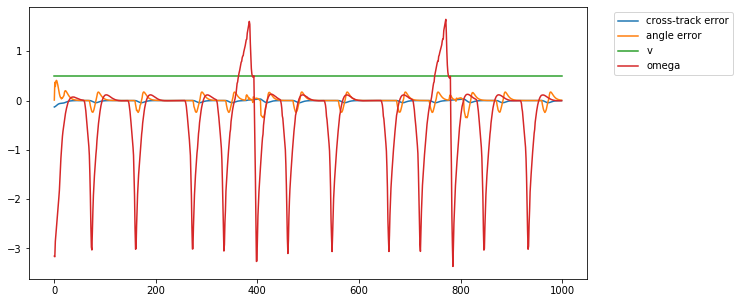

In [43]:
plt.plot(np.arange(1000), dist_in_time)
plt.plot(np.arange(1000), angle_in_time)
plt.plot(np.arange(1000), v_in_time)
plt.plot(np.arange(1000), omega_in_time)
plt.legend(["cross-track error", "angle error", "v", "omega"],bbox_to_anchor=(1.04,1), loc="upper left")
plt.show()